# Integrantes



*   Adrián Landaverde Nava
*   Cristian Gonzaga López
*   Sabrina Nicole Rodriguez Salgado
*   Naomi Padilla Mora



# 01. Librerías y Datos iniciales

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install geopandas

     |████████████████████████████████| 1.0 MB 5.4 MB/s 
     |████████████████████████████████| 6.3 MB 33.7 MB/s 
     |████████████████████████████████| 15.4 MB 20.6 MB/s 


In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import random
from shapely.geometry import Point
import math
import folium
from folium import Marker, GeoJson
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
from folium import Circle
import numpy as np

In [ ]:
mapa = gpd.read_file("/content/drive/MyDrive/Universidad/Tercer Semestre/Modelación con Ecuaciones Diferenciales/México_Estados.shp")
mapa= mapa.sort_values('ESTADO')
mapa.head(32)

,CODIGO,ESTADO,geometry
4,MX01,Aguascalientes,"POLYGON ((-101.84620 22.01176, -101.96530 21.8..."
0,MX02,Baja California,"MULTIPOLYGON (((-113.13972 29.01778, -113.2405..."
1,MX03,Baja California Sur,"MULTIPOLYGON (((-111.20612 25.80278, -111.2302..."
14,MX04,Campeche,"MULTIPOLYGON (((-91.83446 18.63805, -91.84195 ..."
21,MX05,Chiapas,"POLYGON ((-91.43750 17.24111, -91.35278 17.176..."
23,MX06,Chihuahua,"POLYGON ((-108.47130 26.96133, -108.60420 27.0..."
24,MX07,Coahuila,"POLYGON ((-103.29015 28.99773, -103.28035 28.9..."
11,MX08,Colima,"POLYGON ((-103.74548 18.68807, -104.00446 18.8..."
10,MX09,Distrito Federal,"POLYGON ((-99.28487 19.14244, -99.34056 19.357..."
26,MX10,Durango,"POLYGON ((-104.31140 22.31921, -104.34500 22.4..."


In [ ]:
poblacion= pd.read_csv("/content/drive/MyDrive/Universidad/Tercer Semestre/Modelación con Ecuaciones Diferenciales/poblacionEstados.csv",encoding="latin-1")
poblacion.head()

,Estado,Ppoblacion
0,Aguascalientes,1425607
1,Baja California,3769020
2,Baja California Sur,798447
3,Campeche,928363
4,Chiapas,5543828


In [ ]:
mapa.index= list(range(0,32))
mapa["POBLACION"]=poblacion["Ppoblacion"]
mapa.head()

,CODIGO,ESTADO,geometry,POBLACION
0,MX01,Aguascalientes,"POLYGON ((-101.84620 22.01176, -101.96530 21.8...",1425607
1,MX02,Baja California,"MULTIPOLYGON (((-113.13972 29.01778, -113.2405...",3769020
2,MX03,Baja California Sur,"MULTIPOLYGON (((-111.20612 25.80278, -111.2302...",798447
3,MX04,Campeche,"MULTIPOLYGON (((-91.83446 18.63805, -91.84195 ...",928363
4,MX05,Chiapas,"POLYGON ((-91.43750 17.24111, -91.35278 17.176...",5543828


In [ ]:
mapa.crs = {'init': 'epsg:4326'}

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


MULTIPOLYGON (((-90.98583984375 16.8680534362793, -90.98333740234375 16.90305328369141, -90.95529174804688 16.89916610717773, -90.96612548828125 16.87194442749023, -90.92111206054688 16.82971954345703, -90.8033447265625 16.80499649047852, -90.71427917480469 16.72645950317383, -90.65806579589844 16.6441650390625, -90.665283203125 16.58305358886719, -90.63166809082031 16.58138656616211, -90.64500427246094 16.5191650390625, -90.61111450195312 16.51055526733398, -90.63417053222656 16.48388671875, -90.54640197753906 16.4849967956543, -90.48167419433594 16.45833206176758, -90.4808349609375 16.42610931396484, -90.39584350585938 16.41555404663086, -90.37889099121094 16.36527633666992, -90.4202880859375 16.35972213745117, -90.39111328125 16.3408317565918, -90.45945739746094 16.25277709960938, -90.4364013671875 16.23722076416016, -90.45973205566406 16.19083023071289, -90.42750549316406 16.16749954223633, -90.46084594726562 16.10638809204102, -90.43167114257812 16.10221862792969, -90.458068847656

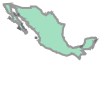

In [ ]:
from shapely.ops import unary_union
mapaMexico = unary_union(mapa["geometry"])
print(mapaMexico)
mapaMexico

# 02. Creación de puntos

## A) Población distribuida uniformemente

In [ ]:
def generate_random(number, polygon):
    points = []
    minx, miny, maxx, maxy = polygon.bounds
    while len(points) < number:
        pnt = Point(random.uniform(minx, maxx), random.uniform(miny, maxy))
        if polygon.contains(pnt):
            points.append(pnt)
            if(len(points)%10000==0):
              print(str(len(points))+" puntos simulados")
    return points

In [ ]:
df_aleatorios= pd.DataFrame(columns=["geometry"])
df_aleatorios["geometry"]=generate_random(10000,mapaMexico)
df_aleatorios.head()

10000 puntos simulados


,geometry
0,POINT (-111.1099943738246 26.06543218178455)
1,POINT (-95.6287848388629 17.95820904071627)
2,POINT (-87.60720781907713 19.16879716042934)
3,POINT (-97.38382565440624 21.03958778980115)
4,POINT (-97.19581378896687 19.02093990711924)


In [ ]:
gdf_aleatorios= gpd.GeoDataFrame(df_aleatorios)
gdf_aleatorios['lon'] = gdf_aleatorios.geometry.x
gdf_aleatorios['lat'] = gdf_aleatorios.geometry.y
gdf_aleatorios.head()

,geometry,lon,lat
0,POINT (-111.10999 26.06543),-111.109994,26.065432
1,POINT (-95.62878 17.95821),-95.628785,17.958209
2,POINT (-87.60721 19.16880),-87.607208,19.168797
3,POINT (-97.38383 21.03959),-97.383826,21.039588
4,POINT (-97.19581 19.02094),-97.195814,19.020940


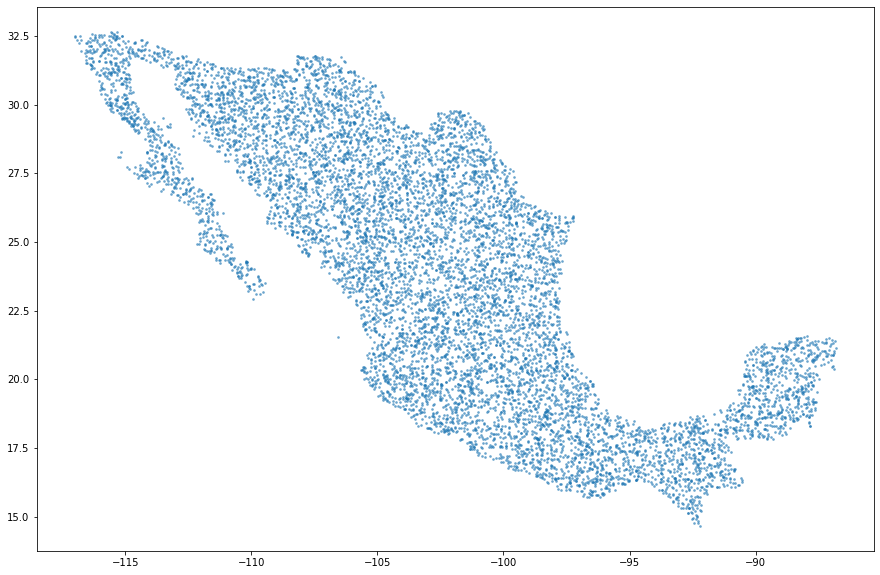

In [ ]:
figure(figsize=(15, 10))
plt.scatter(gdf_aleatorios['lon'],gdf_aleatorios['lat'],alpha=0.5,s=3)

In [ ]:
gdf_aleatoriosA=gdf_aleatorios

## B) Población distribuida uniformemente por Estado

In [ ]:
def generate_random(number, polygon):
    points = []
    minx, miny, maxx, maxy = polygon.bounds
    while len(points) < number:
        pnt = Point(random.uniform(minx, maxx), random.uniform(miny, maxy))
        if polygon.contains(pnt):
            points.append(pnt)
    return points

In [ ]:
df_aleatorios= pd.DataFrame(columns=["geometry"])
df_aleatorios
for i in range(0,32):
  aleatorios= generate_random(round(mapa["POBLACION"][i]/10000),mapa.iloc[i]['geometry'])
  df = pd.DataFrame(aleatorios,columns=["geometry"])
  df_aleatorios= df_aleatorios.append(df)
  print("Estados terminados: "+str(i+1)+ "   Población Acumulada= " +str(df_aleatorios.size))
print("Población Total=" +str(df_aleatorios.size))


Estados terminados: 1   Población Acumulada= 143
Estados terminados: 2   Población Acumulada= 520
Estados terminados: 3   Población Acumulada= 600
Estados terminados: 4   Población Acumulada= 693
Estados terminados: 5   Población Acumulada= 1247
Estados terminados: 6   Población Acumulada= 1621
Estados terminados: 7   Población Acumulada= 1936
Estados terminados: 8   Población Acumulada= 2009
Estados terminados: 9   Población Acumulada= 2930
Estados terminados: 10   Población Acumulada= 3113
Estados terminados: 11   Población Acumulada= 3730
Estados terminados: 12   Población Acumulada= 4084
Estados terminados: 13   Población Acumulada= 4392
Estados terminados: 14   Población Acumulada= 5227
Estados terminados: 15   Población Acumulada= 5702
Estados terminados: 16   Población Acumulada= 5899
Estados terminados: 17   Población Acumulada= 7598
Estados terminados: 18   Población Acumulada= 7722
Estados terminados: 19   Población Acumulada= 8300
Estados terminados: 20   Población Acumulada

In [ ]:
gdf_aleatorios= gpd.GeoDataFrame(df_aleatorios)
gdf_aleatorios['lon'] = gdf_aleatorios.geometry.x
gdf_aleatorios['lat'] = gdf_aleatorios.geometry.y
gdf_aleatorios.head()

,geometry,lon,lat
0,POINT (-102.32694 22.29892),-102.326942,22.298924
1,POINT (-102.32880 22.41822),-102.328796,22.418217
2,POINT (-102.35600 21.92691),-102.355998,21.926915
3,POINT (-102.54128 22.03934),-102.541275,22.039338
4,POINT (-102.49417 21.87820),-102.494172,21.878198


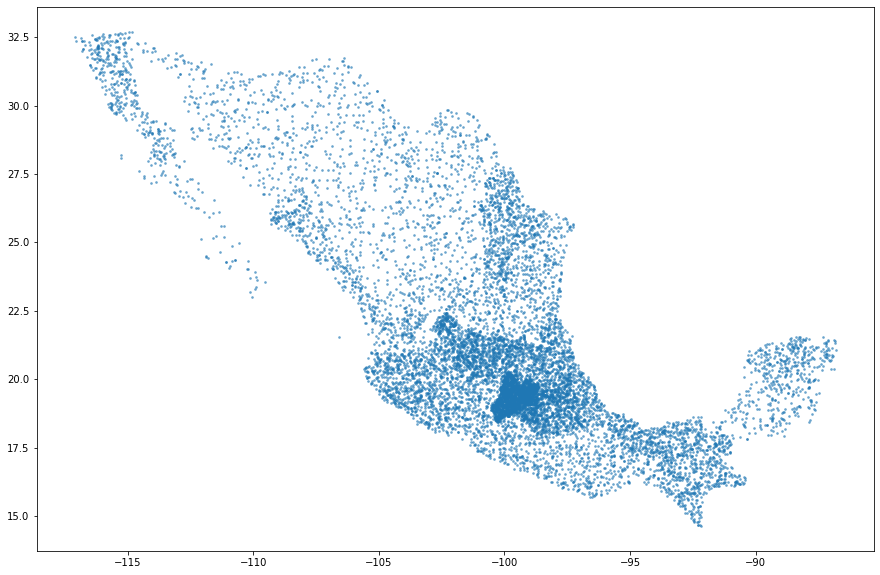

In [ ]:
figure(figsize=(15, 10))
plt.scatter(gdf_aleatorios['lon'],gdf_aleatorios['lat'],alpha=0.5,s=3)

In [ ]:
gdf_aleatoriosB=gdf_aleatorios

## C) Ciudades Distribuidas uniformemente

In [ ]:
def generate_random(number, polygon):
    points = []
    minx, miny, maxx, maxy = polygon.bounds
    while len(points) < number:
        pnt = Point(random.uniform(minx, maxx), random.uniform(miny, maxy))
        if polygon.contains(pnt):
            points.append(pnt)
    return points

In [ ]:
n_ciudades= 500
df_aleatorios= pd.DataFrame(columns=["geometry"])
df_aleatorios["geometry"]=generate_random(n_ciudades,mapaMexico)
df_aleatorios.head()

,geometry
0,POINT (-98.1180698939997 23.30286094816388)
1,POINT (-98.46797965344474 22.18249891573257)
2,POINT (-105.7454164808856 23.15112091563822)
3,POINT (-88.12073701992587 20.91658675598732)
4,POINT (-102.1195022055532 23.85132795333446)


In [ ]:
gdf_aleatorios= gpd.GeoDataFrame(df_aleatorios)
gdf_aleatorios['lon'] = gdf_aleatorios.geometry.x
gdf_aleatorios['lat'] = gdf_aleatorios.geometry.y
gdf_aleatorios.crs = {'init': 'epsg:4326'}
gdf_aleatorios.head()

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,geometry,lon,lat
0,POINT (-98.11807 23.30286),-98.118070,23.302861
1,POINT (-98.46798 22.18250),-98.467980,22.182499
2,POINT (-105.74542 23.15112),-105.745416,23.151121
3,POINT (-88.12074 20.91659),-88.120737,20.916587
4,POINT (-102.11950 23.85133),-102.119502,23.851328


<Figure size 1080x720 with 0 Axes>

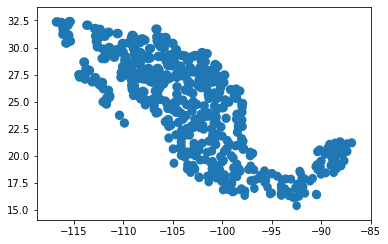

In [ ]:
radioCiudad= 50 #Kilómetros
bufferCiudades = gdf_aleatorios.to_crs(epsg=2272).geometry.buffer(radioCiudad*3280.84)
figure(figsize=(15, 10))
bufferCiudades.to_crs(epsg=4326).plot()

In [ ]:
df_aleatorios2= pd.DataFrame(columns=["geometry"])
for i in range(0,n_ciudades):
  aleatorios= generate_random(10000/n_ciudades,bufferCiudades[i])
  df = pd.DataFrame(aleatorios,columns=["geometry"])
  df_aleatorios2= df_aleatorios2.append(df)
  if((i+1)%(n_ciudades/10)==0):
    print(str((i+1)/(n_ciudades))+"% completo")
print("Población Total=" +str(df_aleatorios2.size))

0.1% completo
0.2% completo
0.3% completo
0.4% completo
0.5% completo
0.6% completo
0.7% completo
0.8% completo
0.9% completo
1.0% completo
Población Total=10000


In [ ]:
gdf_aleatorios2= gpd.GeoDataFrame(df_aleatorios2)
gdf_aleatorios2.crs = {'init': 'epsg:2272'}
gdf_aleatorios2= gdf_aleatorios2.to_crs(epsg=4326)
gdf_aleatorios2['lon'] = gdf_aleatorios2.geometry.x
gdf_aleatorios2['lat'] = gdf_aleatorios2.geometry.y
gdf_aleatorios2.head()

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,geometry,lon,lat
0,POINT (-98.29853 23.13969),-98.298532,23.139685
1,POINT (-97.84258 23.14940),-97.842578,23.149402
2,POINT (-98.04522 23.64737),-98.045225,23.647367
3,POINT (-97.79918 23.09646),-97.799179,23.096464
4,POINT (-97.72551 23.26952),-97.725506,23.269515


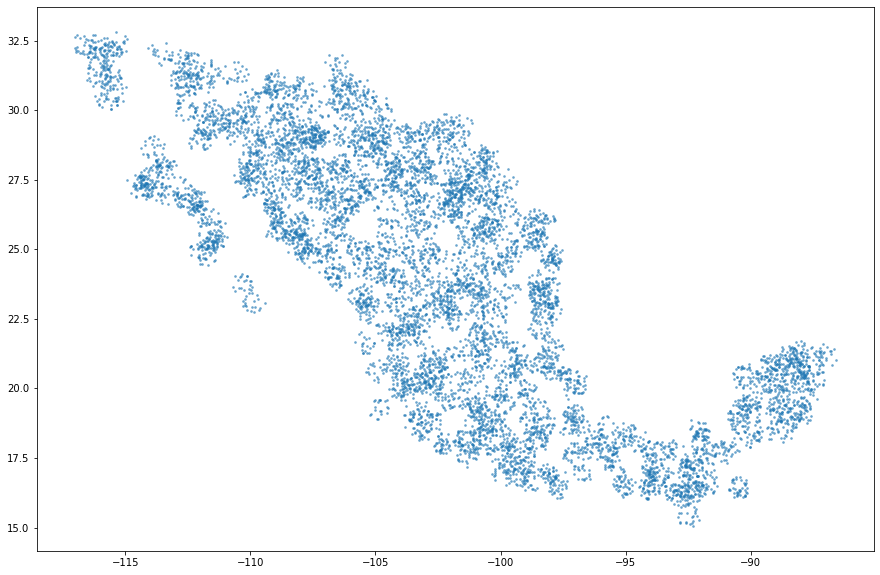

In [ ]:
figure(figsize=(15, 10))
plt.scatter(gdf_aleatorios2['lon'],gdf_aleatorios2['lat'],alpha=0.5,s=3)

In [ ]:
gdf_aleatoriosC=gdf_aleatorios2

## D) Ciudades distribuidas uniformemente por Estado

In [ ]:
def generate_random(number, polygon):
    points = []
    minx, miny, maxx, maxy = polygon.bounds
    while len(points) < number:
        pnt = Point(random.uniform(minx, maxx), random.uniform(miny, maxy))
        if polygon.contains(pnt):
            points.append(pnt)
    return points

In [ ]:
poblacionPorCiudad= 20
df_aleatorios= pd.DataFrame(columns=["geometry"])
df_aleatorios
for i in range(0,32):
  aleatorios= generate_random(round(mapa["POBLACION"][i]/(10000*poblacionPorCiudad)),mapa.iloc[i]['geometry'])
  df = pd.DataFrame(aleatorios,columns=["geometry"])
  df_aleatorios= df_aleatorios.append(df)
  print("Estados terminados: "+str(i+1)+ "   Ciudades Acumuladas= " +str(df_aleatorios.size))
print("Ciudades Totales=" +str(df_aleatorios.size))

Estados terminados: 1   Ciudades Acumuladas= 7
Estados terminados: 2   Ciudades Acumuladas= 26
Estados terminados: 3   Ciudades Acumuladas= 30
Estados terminados: 4   Ciudades Acumuladas= 35
Estados terminados: 5   Ciudades Acumuladas= 63
Estados terminados: 6   Ciudades Acumuladas= 82
Estados terminados: 7   Ciudades Acumuladas= 98
Estados terminados: 8   Ciudades Acumuladas= 102
Estados terminados: 9   Ciudades Acumuladas= 148
Estados terminados: 10   Ciudades Acumuladas= 157
Estados terminados: 11   Ciudades Acumuladas= 188
Estados terminados: 12   Ciudades Acumuladas= 206
Estados terminados: 13   Ciudades Acumuladas= 221
Estados terminados: 14   Ciudades Acumuladas= 263
Estados terminados: 15   Ciudades Acumuladas= 287
Estados terminados: 16   Ciudades Acumuladas= 297
Estados terminados: 17   Ciudades Acumuladas= 382
Estados terminados: 18   Ciudades Acumuladas= 388
Estados terminados: 19   Ciudades Acumuladas= 417
Estados terminados: 20   Ciudades Acumuladas= 438
Estados terminado

In [ ]:
gdf_aleatorios= gpd.GeoDataFrame(df_aleatorios)
gdf_aleatorios['lon'] = gdf_aleatorios.geometry.x
gdf_aleatorios['lat'] = gdf_aleatorios.geometry.y
gdf_aleatorios.crs = {'init': 'epsg:4326'}
gdf_aleatorios.head()

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,geometry,lon,lat
0,POINT (-102.47581 21.69959),-102.475813,21.699593
1,POINT (-102.37885 22.14839),-102.378848,22.148387
2,POINT (-102.11581 22.17881),-102.115814,22.178809
3,POINT (-102.66826 21.79252),-102.668259,21.792516
4,POINT (-102.56263 22.05372),-102.562633,22.053723


In [ ]:
gdf_aleatorios.index=list(range(0,len(gdf_aleatorios)))

<Figure size 1080x720 with 0 Axes>

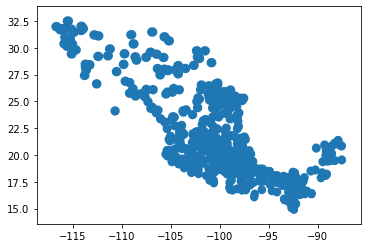

In [ ]:
radioCiudad= 50 #Kilómetros
bufferCiudades = gdf_aleatorios.to_crs(epsg=2272).geometry.buffer(radioCiudad*3280.84)
figure(figsize=(15, 10))
bufferCiudades.to_crs(epsg=4326).plot()

In [ ]:
df_aleatorios2= pd.DataFrame(columns=["geometry"])
for i in range(0,len(bufferCiudades)):
  aleatorios= generate_random(poblacionPorCiudad,bufferCiudades[i])
  df = pd.DataFrame(aleatorios,columns=["geometry"])
  df_aleatorios2= df_aleatorios2.append(df)
print("Población Total=" +str(df_aleatorios2.size))

Población Total=12660


In [ ]:
gdf_aleatorios2= gpd.GeoDataFrame(df_aleatorios2)
gdf_aleatorios2.crs = {'init': 'epsg:2272'}
gdf_aleatorios2= gdf_aleatorios2.to_crs(epsg=4326)
gdf_aleatorios2['lon'] = gdf_aleatorios2.geometry.x
gdf_aleatorios2['lat'] = gdf_aleatorios2.geometry.y
gdf_aleatorios2.head()

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,geometry,lon,lat
0,POINT (-102.15023 21.80361),-102.150229,21.803611
1,POINT (-102.14690 21.51439),-102.146898,21.514386
2,POINT (-102.46355 21.40370),-102.463555,21.403696
3,POINT (-102.55497 21.86642),-102.554974,21.866415
4,POINT (-102.63287 22.01591),-102.632873,22.015908


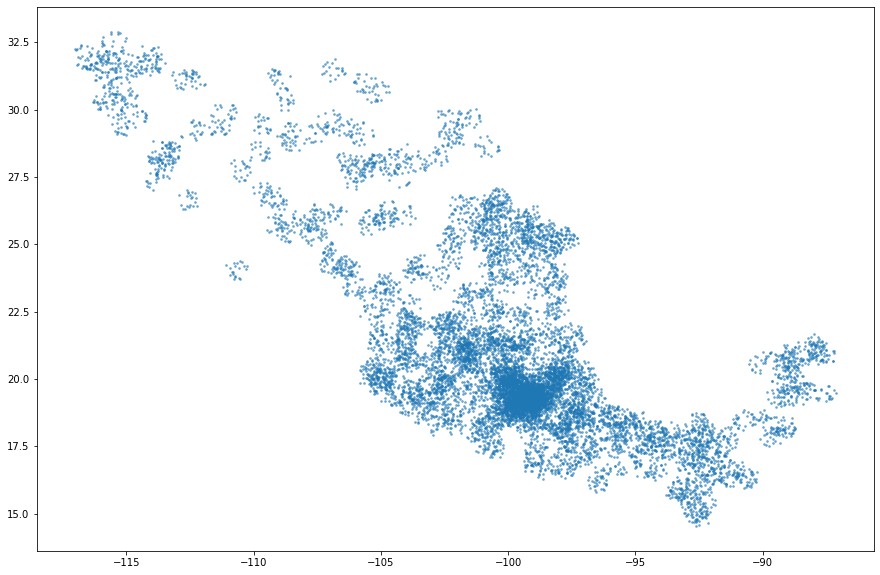

In [ ]:
figure(figsize=(15, 10))
plt.scatter(gdf_aleatorios2['lon'],gdf_aleatorios2['lat'],alpha=0.5,s=3)

In [ ]:
gdf_aleatoriosD=gdf_aleatorios2

# 03. Condiciones iniciales de la Infección

In [ ]:
#gdf_aleatorioF= gdf_aleatoriosA
#gdf_aleatorioF= gdf_aleatoriosB
gdf_aleatorioF= gdf_aleatoriosC
#gdf_aleatorioF= gdf_aleatoriosD
gdf_aleatorioF.head()

,geometry,lon,lat,status,id
id,,,,,
0,POINT (-98.29853 23.13969),-98.298532,23.139685,suceptible,0
1,POINT (-97.84258 23.14940),-97.842578,23.149402,suceptible,1
2,POINT (-98.04522 23.64737),-98.045225,23.647367,suceptible,2
3,POINT (-97.79918 23.09646),-97.799179,23.096464,suceptible,3
4,POINT (-97.72551 23.26952),-97.725506,23.269515,suceptible,4


In [ ]:
#Condiciones iniciales:
N= len(gdf_aleatorioF)
I0  = 1 #número infectados inicial
R0 = 0 #número recuperados inicial
D0 = 0 #número muertos inicial
S0 = N-I0-D0-R0 #Número de susceptibles inicial

infection_radius = 0.3  #distancia para decidir si una persona se infecta o no
recovery_rate = 0.03
death_rate = 0.0003

### Definir un array donde aparezca un número de elementos "susceptible" igual a S0, un número de elementos "infected" igual a I0,
### un número de elementos "recovered" igual a R0 y un número de elementos "dead" igual a D0
## Sug.:usar np.repeat()
sus= np.repeat("suceptible",S0)
inf= np.repeat("infected",I0)
rec= np.repeat("recovered",R0)
dead= np.repeat("dead",D0)
status = np.concatenate((sus,inf,rec,dead))
ststaus= random.shuffle(status)

### Crear un array de N elementos iguales a 0 (usar np.repeat())
#iteration = np.repeat(0,N)
### Crear un array de N elementos que contenga valores de 1 a N
id = list(range(0,N))

In [ ]:
gdf_aleatorioF["status"]=status
#gdf_aleatorioF["iteration"]=iteration
gdf_aleatorioF["id"]=id
gdf_aleatorioF.index=gdf_aleatorioF["id"]
gdf_aleatorioF=gdf_aleatorioF.drop(["id"],axis=1)
gdf_aleatorioF.rename(columns={'geometry': 'geometry0', 'lon': 'lon0', 'lat':'lat0','status':'status0'}, inplace=True)
gdf_aleatorioF

,geometry0,lon0,lat0,status0
id,,,,
0,POINT (-98.29853 23.13969),-98.298532,23.139685,suceptible
1,POINT (-97.84258 23.14940),-97.842578,23.149402,suceptible
2,POINT (-98.04522 23.64737),-98.045225,23.647367,suceptible
3,POINT (-97.79918 23.09646),-97.799179,23.096464,suceptible
4,POINT (-97.72551 23.26952),-97.725506,23.269515,suceptible
...,...,...,...,...
9995,POINT (-100.23151 21.88579),-100.231514,21.885786,suceptible
9996,POINT (-99.76801 21.86054),-99.768007,21.860537,suceptible
9997,POINT (-99.74819 21.48411),-99.748190,21.484113,suceptible


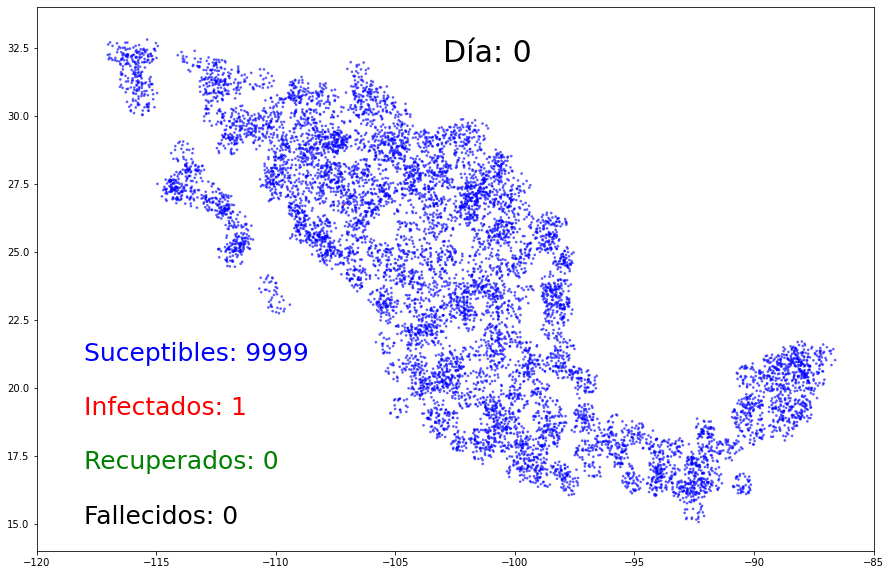

In [ ]:
colors = {'recovered':'green', 'infected':'red', 'dead':'black', 'suceptible':'blue'}
sDia = dict(size=30, color='black')
sSuceptibles = dict(size=25, color='blue')
sInfectados = dict(size=25, color='red')
sRecuperados = dict(size=25, color='green')
sFallecidos = dict(size=25, color='black')
fig, ax = plt.subplots(figsize=(15, 10))
ax.scatter(gdf_aleatorioF['lon0'],gdf_aleatorioF['lat0'],c=gdf_aleatorioF["status0"].map(colors),alpha=0.5,s=3)
ax.text(-103, 32, ("Día: 0"),**sDia)
ax.text(-118, 21, ("Suceptibles: "+str(S0)),**sSuceptibles)
ax.text(-118, 19, ("Infectados: "+str(I0)),**sInfectados)
ax.text(-118, 17, ("Recuperados: "+str(R0)),**sRecuperados)
ax.text(-118, 15, ("Fallecidos: "+str(D0)),**sFallecidos)
ax.set_xlim(-120, -85)
ax.set_ylim(14, 34)
plt.show()

In [ ]:
def infec(lonA,latA,lonB,latB):
  distancia= np.sqrt(np.power(list(np.array(lonA)-np.array(lonB)),2)+np.power(list(np.array(latA)-np.array(latB)),2))
  return ((distancia<infection_radius))

# 04. Movimiento Aleatorio

In [ ]:
pd.set_option('mode.chained_assignment', None)

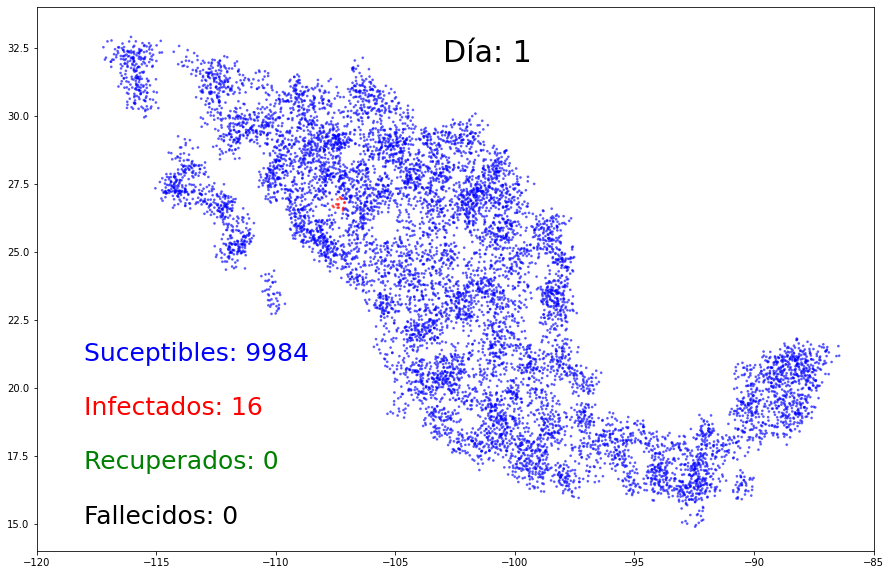

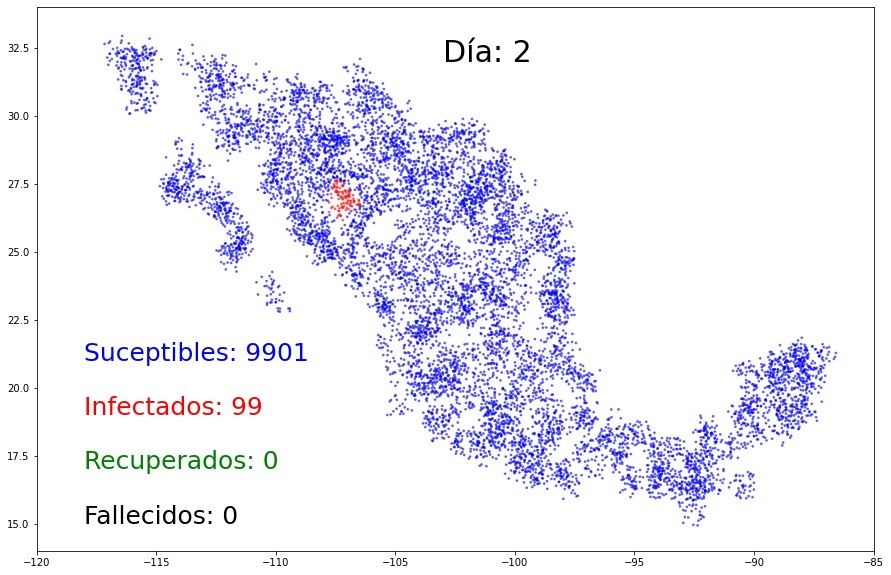

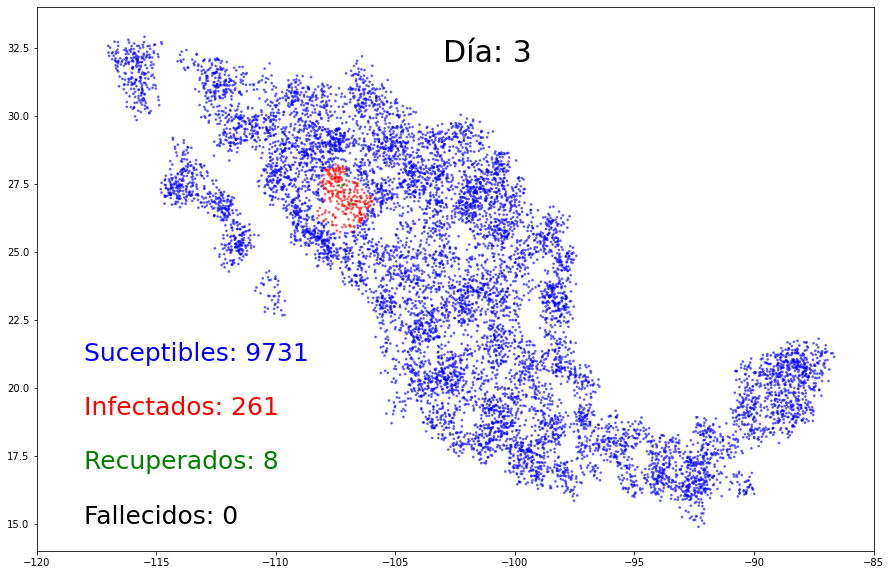

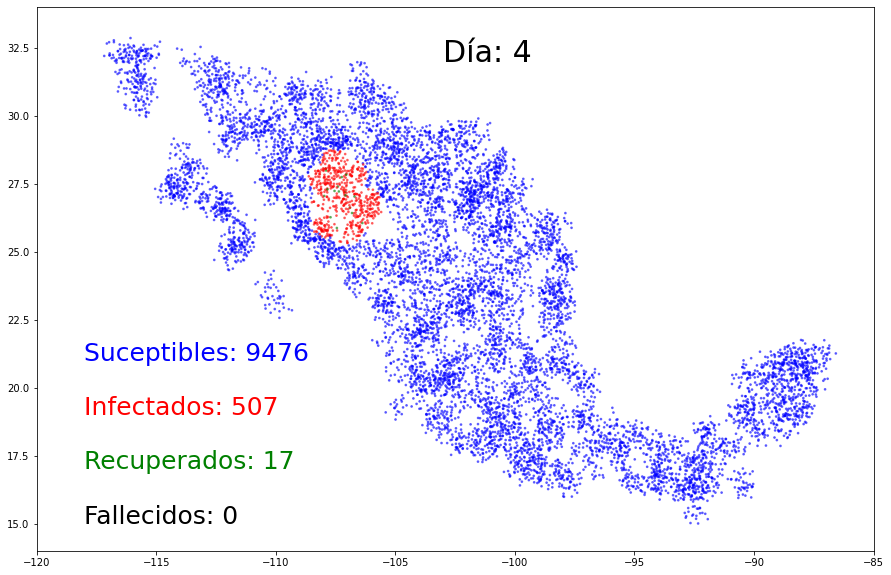

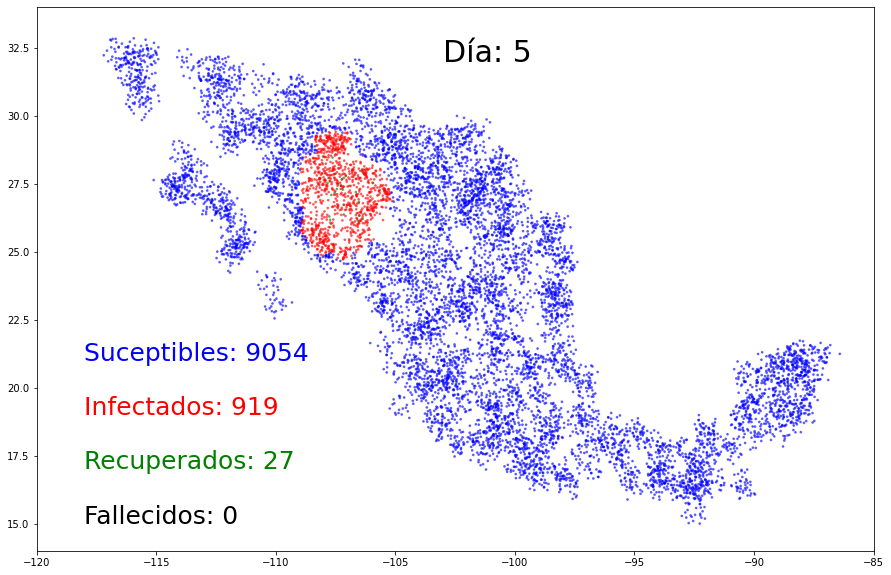

...

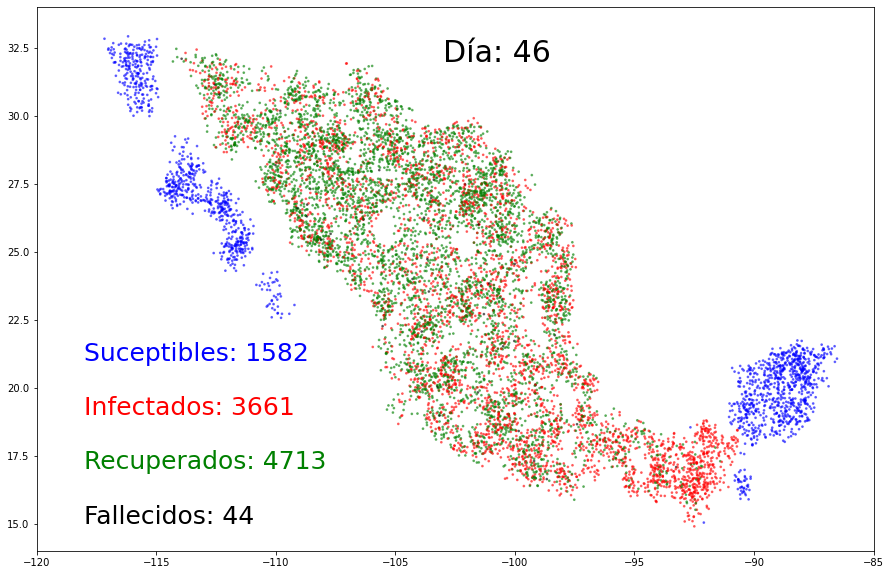

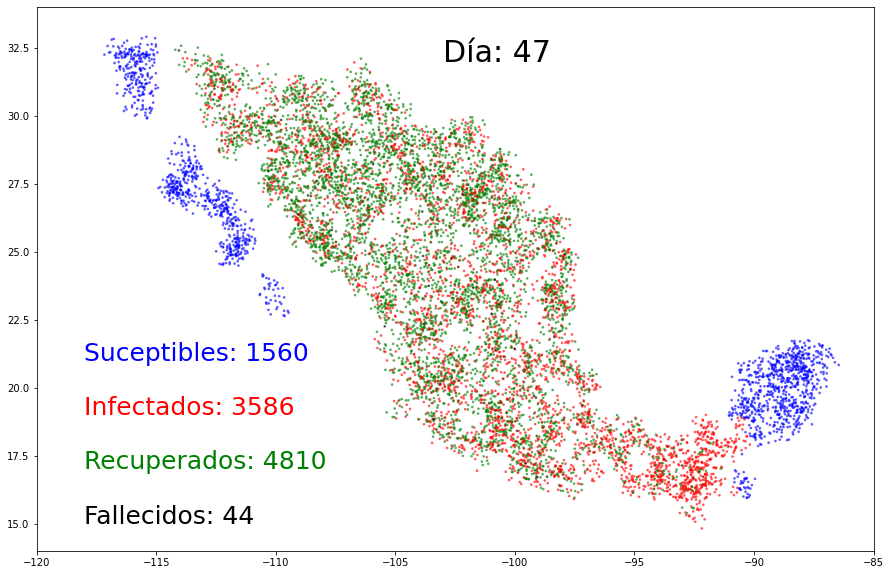

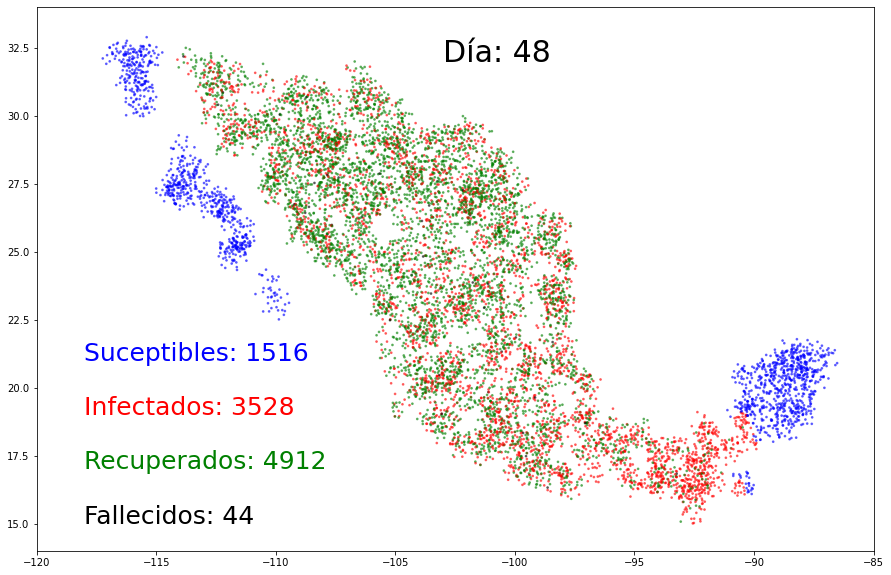

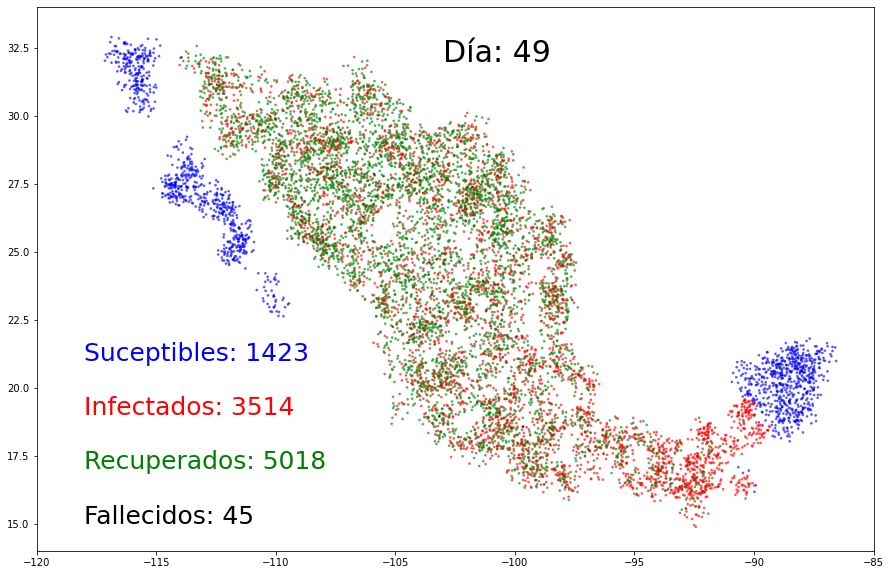

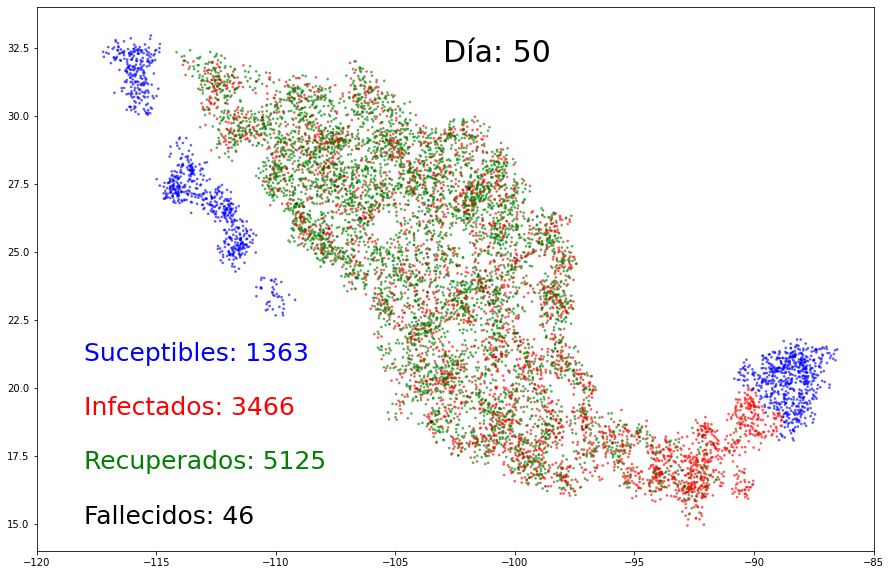

In [ ]:
gdf_aleatorioF['statusN']=gdf_aleatorioF['status0']
for i in range(1,51):
  # Movimiento Aleatorio
  randLon= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  randLat= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  gdf_aleatorioF['lonN']=gdf_aleatorioF['lon0']+randLon
  gdf_aleatorioF['latN']=gdf_aleatorioF['lat0']+randLat
  

  # Recuperación
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randRec= (np.random.random_sample(size = len(df_infectados)))
  boolsRec=(randRec<recovery_rate)
  indicesRec= df_infectados.loc[boolsRec]
  indicesRec= indicesRec.index.to_list()
  gdf_aleatorioF.loc[indicesRec,["statusN"]]="recovered"

  # Fallecimiento
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randMuer= (np.random.random_sample(size = len(df_infectados)))
  boolsMuer=(randMuer<death_rate)
  indicesMuer= df_infectados.loc[boolsMuer]
  indicesMuer= indicesMuer.index.to_list()
  gdf_aleatorioF.loc[indicesMuer,["statusN"]]="dead"

  
  # Transmisión de la enfermedad
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  df_suceptibles= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "suceptible"]
  for j in df_infectados.index.to_list():
    iteracionInf=df_infectados.iloc[df_infectados.index.get_loc(j)]
    bools= infec(iteracionInf['lonN'],iteracionInf['latN'],list(df_suceptibles['lonN']),list(df_suceptibles['latN']))
    df_suceptibles["contagiado"]=bools
    indices= df_suceptibles.loc[bools]
    indices= indices.index.to_list()
    gdf_aleatorioF.loc[indices,["statusN"]]="infected"
  nS= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "suceptible"])
  nI= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "infected"])
  nR= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "recovered"])
  nD= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "dead"])
  fig, ax = plt.subplots(figsize=(15, 10))
  ax.scatter(gdf_aleatorioF['lonN'],gdf_aleatorioF['latN'],c=gdf_aleatorioF["statusN"].map(colors),alpha=0.5,s=3)
  ax.text(-103, 32, ("Día: "+str(i)),**sDia)
  ax.text(-118, 21, ("Suceptibles: "+str(nS)),**sSuceptibles)
  ax.text(-118, 19, ("Infectados: "+str(nI)),**sInfectados)
  ax.text(-118, 17, ("Recuperados: "+str(nR)),**sRecuperados)
  ax.text(-118, 15, ("Fallecidos: "+str(nD)),**sFallecidos)
  ax.set_xlim(-120, -85)
  ax.set_ylim(14, 34)
  plt.show()





In [ ]:
for i in range(51,101):
  # Movimiento Aleatorio
  randLon= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  randLat= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  gdf_aleatorioF['lonN']=gdf_aleatorioF['lon0']+randLon
  gdf_aleatorioF['latN']=gdf_aleatorioF['lat0']+randLat
  

  # Recuperación
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randRec= (np.random.random_sample(size = len(df_infectados)))
  boolsRec=(randRec<recovery_rate)
  indicesRec= df_infectados.loc[boolsRec]
  indicesRec= indicesRec.index.to_list()
  gdf_aleatorioF.loc[indicesRec,["statusN"]]="recovered"

  # Fallecimiento
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randMuer= (np.random.random_sample(size = len(df_infectados)))
  boolsMuer=(randMuer<death_rate)
  indicesMuer= df_infectados.loc[boolsMuer]
  indicesMuer= indicesMuer.index.to_list()
  gdf_aleatorioF.loc[indicesMuer,["statusN"]]="dead"

  
  # Transmisión de la enfermedad
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  df_suceptibles= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "suceptible"]
  for j in df_infectados.index.to_list():
    iteracionInf=df_infectados.iloc[df_infectados.index.get_loc(j)]
    bools= infec(iteracionInf['lonN'],iteracionInf['latN'],list(df_suceptibles['lonN']),list(df_suceptibles['latN']))
    df_suceptibles["contagiado"]=bools
    indices= df_suceptibles.loc[bools]
    indices= indices.index.to_list()
    gdf_aleatorioF.loc[indices,["statusN"]]="infected"
  nS= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "suceptible"])
  nI= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "infected"])
  nR= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "recovered"])
  nD= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "dead"])
  fig, ax = plt.subplots(figsize=(15, 10))
  ax.scatter(gdf_aleatorioF['lonN'],gdf_aleatorioF['latN'],c=gdf_aleatorioF["statusN"].map(colors),alpha=0.5,s=3)
  ax.text(-103, 32, ("Día: "+str(i)),**sDia)
  ax.text(-118, 21, ("Suceptibles: "+str(nS)),**sSuceptibles)
  ax.text(-118, 19, ("Infectados: "+str(nI)),**sInfectados)
  ax.text(-118, 17, ("Recuperados: "+str(nR)),**sRecuperados)
  ax.text(-118, 15, ("Fallecidos: "+str(nD)),**sFallecidos)
  ax.set_xlim(-120, -85)
  ax.set_ylim(14, 34)
  plt.show()


In [ ]:
for i in range(101,151):
  # Movimiento Aleatorio
  randLon= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  randLat= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  gdf_aleatorioF['lonN']=gdf_aleatorioF['lon0']+randLon
  gdf_aleatorioF['latN']=gdf_aleatorioF['lat0']+randLat
  

  # Recuperación
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randRec= (np.random.random_sample(size = len(df_infectados)))
  boolsRec=(randRec<recovery_rate)
  indicesRec= df_infectados.loc[boolsRec]
  indicesRec= indicesRec.index.to_list()
  gdf_aleatorioF.loc[indicesRec,["statusN"]]="recovered"

  # Fallecimiento
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randMuer= (np.random.random_sample(size = len(df_infectados)))
  boolsMuer=(randMuer<death_rate)
  indicesMuer= df_infectados.loc[boolsMuer]
  indicesMuer= indicesMuer.index.to_list()
  gdf_aleatorioF.loc[indicesMuer,["statusN"]]="dead"

  
  # Transmisión de la enfermedad
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  df_suceptibles= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "suceptible"]
  for j in df_infectados.index.to_list():
    iteracionInf=df_infectados.iloc[df_infectados.index.get_loc(j)]
    bools= infec(iteracionInf['lonN'],iteracionInf['latN'],list(df_suceptibles['lonN']),list(df_suceptibles['latN']))
    df_suceptibles["contagiado"]=bools
    indices= df_suceptibles.loc[bools]
    indices= indices.index.to_list()
    gdf_aleatorioF.loc[indices,["statusN"]]="infected"
  nS= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "suceptible"])
  nI= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "infected"])
  nR= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "recovered"])
  nD= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "dead"])
  fig, ax = plt.subplots(figsize=(15, 10))
  ax.scatter(gdf_aleatorioF['lonN'],gdf_aleatorioF['latN'],c=gdf_aleatorioF["statusN"].map(colors),alpha=0.5,s=3)
  ax.text(-103, 32, ("Día: "+str(i)),**sDia)
  ax.text(-118, 21, ("Suceptibles: "+str(nS)),**sSuceptibles)
  ax.text(-118, 19, ("Infectados: "+str(nI)),**sInfectados)
  ax.text(-118, 17, ("Recuperados: "+str(nR)),**sRecuperados)
  ax.text(-118, 15, ("Fallecidos: "+str(nD)),**sFallecidos)
  ax.set_xlim(-120, -85)
  ax.set_ylim(14, 34)
  plt.show()

In [ ]:
for i in range(151,201):
  # Movimiento Aleatorio
  randLon= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  randLat= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  gdf_aleatorioF['lonN']=gdf_aleatorioF['lon0']+randLon
  gdf_aleatorioF['latN']=gdf_aleatorioF['lat0']+randLat
  

  # Recuperación
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randRec= (np.random.random_sample(size = len(df_infectados)))
  boolsRec=(randRec<recovery_rate)
  indicesRec= df_infectados.loc[boolsRec]
  indicesRec= indicesRec.index.to_list()
  gdf_aleatorioF.loc[indicesRec,["statusN"]]="recovered"

  # Fallecimiento
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randMuer= (np.random.random_sample(size = len(df_infectados)))
  boolsMuer=(randMuer<death_rate)
  indicesMuer= df_infectados.loc[boolsMuer]
  indicesMuer= indicesMuer.index.to_list()
  gdf_aleatorioF.loc[indicesMuer,["statusN"]]="dead"

  
  # Transmisión de la enfermedad
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  df_suceptibles= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "suceptible"]
  for j in df_infectados.index.to_list():
    iteracionInf=df_infectados.iloc[df_infectados.index.get_loc(j)]
    bools= infec(iteracionInf['lonN'],iteracionInf['latN'],list(df_suceptibles['lonN']),list(df_suceptibles['latN']))
    df_suceptibles["contagiado"]=bools
    indices= df_suceptibles.loc[bools]
    indices= indices.index.to_list()
    gdf_aleatorioF.loc[indices,["statusN"]]="infected"
  nS= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "suceptible"])
  nI= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "infected"])
  nR= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "recovered"])
  nD= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "dead"])
  fig, ax = plt.subplots(figsize=(15, 10))
  ax.scatter(gdf_aleatorioF['lonN'],gdf_aleatorioF['latN'],c=gdf_aleatorioF["statusN"].map(colors),alpha=0.5,s=3)
  ax.text(-103, 32, ("Día: "+str(i)),**sDia)
  ax.text(-118, 21, ("Suceptibles: "+str(nS)),**sSuceptibles)
  ax.text(-118, 19, ("Infectados: "+str(nI)),**sInfectados)
  ax.text(-118, 17, ("Recuperados: "+str(nR)),**sRecuperados)
  ax.text(-118, 15, ("Fallecidos: "+str(nD)),**sFallecidos)
  ax.set_xlim(-120, -85)
  ax.set_ylim(14, 34)
  plt.show()

In [ ]:
for i in range(201,251):
  # Movimiento Aleatorio
  randLon= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  randLat= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  gdf_aleatorioF['lonN']=gdf_aleatorioF['lon0']+randLon
  gdf_aleatorioF['latN']=gdf_aleatorioF['lat0']+randLat
  

  # Recuperación
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randRec= (np.random.random_sample(size = len(df_infectados)))
  boolsRec=(randRec<recovery_rate)
  indicesRec= df_infectados.loc[boolsRec]
  indicesRec= indicesRec.index.to_list()
  gdf_aleatorioF.loc[indicesRec,["statusN"]]="recovered"

  # Fallecimiento
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randMuer= (np.random.random_sample(size = len(df_infectados)))
  boolsMuer=(randMuer<death_rate)
  indicesMuer= df_infectados.loc[boolsMuer]
  indicesMuer= indicesMuer.index.to_list()
  gdf_aleatorioF.loc[indicesMuer,["statusN"]]="dead"

  
  # Transmisión de la enfermedad
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  df_suceptibles= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "suceptible"]
  for j in df_infectados.index.to_list():
    iteracionInf=df_infectados.iloc[df_infectados.index.get_loc(j)]
    bools= infec(iteracionInf['lonN'],iteracionInf['latN'],list(df_suceptibles['lonN']),list(df_suceptibles['latN']))
    df_suceptibles["contagiado"]=bools
    indices= df_suceptibles.loc[bools]
    indices= indices.index.to_list()
    gdf_aleatorioF.loc[indices,["statusN"]]="infected"
  nS= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "suceptible"])
  nI= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "infected"])
  nR= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "recovered"])
  nD= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "dead"])
  fig, ax = plt.subplots(figsize=(15, 10))
  ax.scatter(gdf_aleatorioF['lonN'],gdf_aleatorioF['latN'],c=gdf_aleatorioF["statusN"].map(colors),alpha=0.5,s=3)
  ax.text(-103, 32, ("Día: "+str(i)),**sDia)
  ax.text(-118, 21, ("Suceptibles: "+str(nS)),**sSuceptibles)
  ax.text(-118, 19, ("Infectados: "+str(nI)),**sInfectados)
  ax.text(-118, 17, ("Recuperados: "+str(nR)),**sRecuperados)
  ax.text(-118, 15, ("Fallecidos: "+str(nD)),**sFallecidos)
  ax.set_xlim(-120, -85)
  ax.set_ylim(14, 34)
  plt.show()

In [ ]:
for i in range(251,301):
  # Movimiento Aleatorio
  randLon= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  randLat= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  gdf_aleatorioF['lonN']=gdf_aleatorioF['lon0']+randLon
  gdf_aleatorioF['latN']=gdf_aleatorioF['lat0']+randLat
  

  # Recuperación
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randRec= (np.random.random_sample(size = len(df_infectados)))
  boolsRec=(randRec<recovery_rate)
  indicesRec= df_infectados.loc[boolsRec]
  indicesRec= indicesRec.index.to_list()
  gdf_aleatorioF.loc[indicesRec,["statusN"]]="recovered"

  # Fallecimiento
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randMuer= (np.random.random_sample(size = len(df_infectados)))
  boolsMuer=(randMuer<death_rate)
  indicesMuer= df_infectados.loc[boolsMuer]
  indicesMuer= indicesMuer.index.to_list()
  gdf_aleatorioF.loc[indicesMuer,["statusN"]]="dead"

  
  # Transmisión de la enfermedad
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  df_suceptibles= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "suceptible"]
  for j in df_infectados.index.to_list():
    iteracionInf=df_infectados.iloc[df_infectados.index.get_loc(j)]
    bools= infec(iteracionInf['lonN'],iteracionInf['latN'],list(df_suceptibles['lonN']),list(df_suceptibles['latN']))
    df_suceptibles["contagiado"]=bools
    indices= df_suceptibles.loc[bools]
    indices= indices.index.to_list()
    gdf_aleatorioF.loc[indices,["statusN"]]="infected"
  nS= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "suceptible"])
  nI= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "infected"])
  nR= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "recovered"])
  nD= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "dead"])
  fig, ax = plt.subplots(figsize=(15, 10))
  ax.scatter(gdf_aleatorioF['lonN'],gdf_aleatorioF['latN'],c=gdf_aleatorioF["statusN"].map(colors),alpha=0.5,s=3)
  ax.text(-103, 32, ("Día: "+str(i)),**sDia)
  ax.text(-118, 21, ("Suceptibles: "+str(nS)),**sSuceptibles)
  ax.text(-118, 19, ("Infectados: "+str(nI)),**sInfectados)
  ax.text(-118, 17, ("Recuperados: "+str(nR)),**sRecuperados)
  ax.text(-118, 15, ("Fallecidos: "+str(nD)),**sFallecidos)
  ax.set_xlim(-120, -85)
  ax.set_ylim(14, 34)
  plt.show()

In [ ]:
for i in range(301,366):
  # Movimiento Aleatorio
  randLon= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  randLat= (np.random.random_sample(size = len(gdf_aleatorioF))-0.5)*0.5
  gdf_aleatorioF['lonN']=gdf_aleatorioF['lon0']+randLon
  gdf_aleatorioF['latN']=gdf_aleatorioF['lat0']+randLat
  

  # Recuperación
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randRec= (np.random.random_sample(size = len(df_infectados)))
  boolsRec=(randRec<recovery_rate)
  indicesRec= df_infectados.loc[boolsRec]
  indicesRec= indicesRec.index.to_list()
  gdf_aleatorioF.loc[indicesRec,["statusN"]]="recovered"

  # Fallecimiento
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  randMuer= (np.random.random_sample(size = len(df_infectados)))
  boolsMuer=(randMuer<death_rate)
  indicesMuer= df_infectados.loc[boolsMuer]
  indicesMuer= indicesMuer.index.to_list()
  gdf_aleatorioF.loc[indicesMuer,["statusN"]]="dead"

  
  # Transmisión de la enfermedad
  df_infectados= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "infected"]
  df_suceptibles= gdf_aleatorioF[gdf_aleatorioF['statusN'] == "suceptible"]
  for j in df_infectados.index.to_list():
    iteracionInf=df_infectados.iloc[df_infectados.index.get_loc(j)]
    bools= infec(iteracionInf['lonN'],iteracionInf['latN'],list(df_suceptibles['lonN']),list(df_suceptibles['latN']))
    df_suceptibles["contagiado"]=bools
    indices= df_suceptibles.loc[bools]
    indices= indices.index.to_list()
    gdf_aleatorioF.loc[indices,["statusN"]]="infected"
  nS= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "suceptible"])
  nI= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "infected"])
  nR= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "recovered"])
  nD= len(gdf_aleatorioF[gdf_aleatorioF["statusN"] == "dead"])
  fig, ax = plt.subplots(figsize=(15, 10))
  ax.scatter(gdf_aleatorioF['lonN'],gdf_aleatorioF['latN'],c=gdf_aleatorioF["statusN"].map(colors),alpha=0.5,s=3)
  ax.text(-103, 32, ("Día: "+str(i)),**sDia)
  ax.text(-118, 21, ("Suceptibles: "+str(nS)),**sSuceptibles)
  ax.text(-118, 19, ("Infectados: "+str(nI)),**sInfectados)
  ax.text(-118, 17, ("Recuperados: "+str(nR)),**sRecuperados)
  ax.text(-118, 15, ("Fallecidos: "+str(nD)),**sFallecidos)
  ax.set_xlim(-120, -85)
  ax.set_ylim(14, 34)
  plt.show()